<font size="+3">Landcover toolkit</font>

Import and initialization:

In [1]:
from hera import toolkitHome
import matplotlib.pyplot as plt 

tk = toolkitHome.getToolkit(toolkitHome.GIS_LANDCOVER,projectName="DOCUMENTATION")

Access DataSources list of Project:

In [2]:
tk.getDataSourceList()

['Type-1']

In [3]:
tk.getDataSourceDocument("Type-1")

<Measurements: {
    "_cls": "Metadata.Measurements",
    "projectName": "DOCUMENTATION",
    "desc": {
        "year": 2021,
        "type": 1,
        "desc": {
            "year": 2021,
            "type": 1
        },
        "toolkit": "LandCoverToolkit",
        "datasourceName": "Type-1",
        "version": [
            0,
            0,
            1
        ]
    },
    "type": "ToolkitDataSource",
    "resource": "/home/salo/development/hera/hera/doc/jupyter/data/landcover/prefixaac.tif",
    "dataFormat": "geotiff"
}>

In [4]:
tk.getConfig()

{'analysis_CacheCounter': 5,
 'defaultBuildingDataSource': 'BNTL',
 'defaultSRTM': 'SRTMGL1',
 'defaultLandCover': 'Type-1',
 'defaultTileServer': 'http://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}'}

You can get the mapping of landcover int values to its corresponding labels using the getCodingMap and providing the datasource type.

In [5]:
tk.getCodingMap("Type-1")

{0: 'Water',
 1: 'Evergreen needleleaf forest',
 2: 'Evergreen broadleaf forest',
 3: 'Deciduous needleleaf forest',
 4: 'Deciduous broadleaf forest',
 5: 'Mixed forests',
 6: 'Closed shrubland',
 7: 'Open shrublands',
 8: 'Woody savannas',
 9: 'Savannas',
 10: 'Grasslands',
 11: 'Permanent wetlands',
 12: 'Croplands',
 13: 'Urban and built-up',
 14: 'Cropland/natural vegetation mosaic',
 15: 'Snow and ice',
 16: 'Barren or sparsely vegetated'}

### Landcover map creation and Roughness Example

In [6]:
minlat = 32.7 
minlon = 35.05

maxlat = 32.10 
maxlon = 50.15
dxdy = 700

For creating a Landcover you will need to use the getLandCover() function with the defined variables. An Xarray will be returned:

In [7]:
xarray = tk.getLandCover(minlon,minlat,maxlon,maxlat,dxdy=dxdy,dataSourceName=tk.getDataSourceList()[0])
xarray

Warning 1: Starting with GDAL 3.7, PIXELTYPE=SIGNEDBYTE is no longer used to signal signed 8-bit raster. Change your code to test for the new GDT_Int8 data type instead.


<xarray.DataArray (i: 2046, j: 48)> Size: 98kB
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)
Coordinates:
  * i          (i) int64 16kB 0 1 2 3 4 5 6 ... 2040 2041 2042 2043 2044 2045
  * j          (j) int64 384B 0 1 2 3 4 5 6 7 8 9 ... 39 40 41 42 43 44 45 46 47
    lat        (i, j) float64 786kB 35.05 35.05 35.05 ... 50.14 50.14 50.14
    lon        (i, j) float64 786kB 32.7 32.71 32.71 32.72 ... 32.09 32.09 32.1
    landcover  (i, j) uint8 98kB 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0 0
Attributes:
    landcover_description:  {0: 'Water', 1: 'Evergreen needleleaf forest', 2:...

For adding a Roughness field to the Xarray, use the getRoughnessFromLandcover() method. The field name will be 'z0':

In [8]:
xarray = tk.getRoughnessFromLandcover(xarray)
xarray

<xarray.DataArray (i: 2046, j: 48)> Size: 98kB
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)
Coordinates:
  * i          (i) int64 16kB 0 1 2 3 4 5 6 ... 2040 2041 2042 2043 2044 2045
  * j          (j) int64 384B 0 1 2 3 4 5 6 7 8 9 ... 39 40 41 42 43 44 45 46 47
    lat        (i, j) float64 786kB 35.05 35.05 35.05 ... 50.14 50.14 50.14
    lon        (i, j) float64 786kB 32.7 32.71 32.71 32.72 ... 32.09 32.09 32.1
    landcover  (i, j) uint8 98kB 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0 0
    z0         (i, j) float64 786kB 0.0001 0.0001 0.0001 ... 0.0001 0.0001
Attributes:
    landcover_description:  {0: 'Water', 1: 'Evergreen needleleaf forest', 2:...

In [9]:
xarray['z0']

<xarray.DataArray 'z0' (i: 2046, j: 48)> Size: 786kB
array([[0.0001, 0.0001, 0.0001, ..., 0.0001, 0.0001, 0.0001],
       [0.0001, 0.0001, 0.0001, ..., 0.0001, 0.0001, 0.0001],
       [0.0001, 0.0001, 0.0001, ..., 0.0001, 0.0001, 0.0001],
       ...,
       [0.0001, 0.0001, 0.0001, ..., 0.0001, 0.0001, 0.0001],
       [0.0001, 0.0001, 0.0001, ..., 0.0001, 0.0001, 0.0001],
       [0.0001, 0.0001, 0.0001, ..., 0.0001, 0.0001, 0.0001]])
Coordinates:
  * i          (i) int64 16kB 0 1 2 3 4 5 6 ... 2040 2041 2042 2043 2044 2045
  * j          (j) int64 384B 0 1 2 3 4 5 6 7 8 9 ... 39 40 41 42 43 44 45 46 47
    lat        (i, j) float64 786kB 35.05 35.05 35.05 ... 50.14 50.14 50.14
    lon        (i, j) float64 786kB 32.7 32.71 32.71 32.72 ... 32.09 32.09 32.1
    landcover  (i, j) uint8 98kB 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0 0
    z0         (i, j) float64 786kB 0.0001 0.0001 0.0001 ... 0.0001 0.0001

For applying both functions above at the same time, simply use getRoughness() function:

In [10]:
xarray = tk.getRoughness(minlon,minlat,maxlon,maxlat,dxdy=dxdy,dataSourceName=tk.getDataSourceList()[0])
xarray

Warning 1: Starting with GDAL 3.7, PIXELTYPE=SIGNEDBYTE is no longer used to signal signed 8-bit raster. Change your code to test for the new GDT_Int8 data type instead.


<xarray.DataArray (i: 2046, j: 48)> Size: 98kB
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)
Coordinates:
  * i          (i) int64 16kB 0 1 2 3 4 5 6 ... 2040 2041 2042 2043 2044 2045
  * j          (j) int64 384B 0 1 2 3 4 5 6 7 8 9 ... 39 40 41 42 43 44 45 46 47
    lat        (i, j) float64 786kB 35.05 35.05 35.05 ... 50.14 50.14 50.14
    lon        (i, j) float64 786kB 32.7 32.71 32.71 32.72 ... 32.09 32.09 32.1
    landcover  (i, j) uint8 98kB 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0 0
    z0         (i, j) float64 786kB 0.0001 0.0001 0.0001 ... 0.0001 0.0001
Attributes:
    landcover_description:  {0: 'Water', 1: 'Evergreen needleleaf forest', 2:...

You can meassure the landcover int value for a specific point in the map using getLandCoverAtPoint():

In [11]:
tk.getLandCoverAtPoint(34,35)

Warning 1: Starting with GDAL 3.7, PIXELTYPE=SIGNEDBYTE is no longer used to signal signed 8-bit raster. Change your code to test for the new GDT_Int8 data type instead.


0

The same for roughness using getRoughnessAtPoint():

In [12]:
tk.getRoughnessAtPoint(34,35)

Warning 1: Starting with GDAL 3.7, PIXELTYPE=SIGNEDBYTE is no longer used to signal signed 8-bit raster. Change your code to test for the new GDT_Int8 data type instead.


0.0001

## roughnessWithUrban

In [1]:
from hera import toolkitHome
import matplotlib.pyplot as plt 

tk = toolkitHome.getToolkit(toolkitHome.GIS_LANDCOVER,projectName="DOCUMENTATION")

In [2]:
xarray = tk.getLandCover(175000,655000,195000,680000,dxdy=500,inputCRS=2039,dataSourceName=tk.getDataSourceList()[0])
xarray

Warning 1: Starting with GDAL 3.7, PIXELTYPE=SIGNEDBYTE is no longer used to signal signed 8-bit raster. Change your code to test for the new GDT_Int8 data type instead.


<xarray.DataArray (i: 40, j: 50)> Size: 2kB
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)
Coordinates:
  * i          (i) int64 320B 0 1 2 3 4 5 6 7 8 9 ... 31 32 33 34 35 36 37 38 39
  * j          (j) int64 400B 0 1 2 3 4 5 6 7 8 9 ... 41 42 43 44 45 46 47 48 49
    lat        (i, j) float64 16kB 34.73 34.73 34.73 34.73 ... 34.94 34.94 34.94
    lon        (i, j) float64 16kB 31.99 31.99 32.0 32.0 ... 32.2 32.2 32.21
    landcover  (i, j) uint8 2kB 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0 0
    dxdy       int64 8B 500
Attributes:
    landcover_description:  {0: 'Water', 1: 'Evergreen needleleaf forest', 2:...

## plotLandcover 

In [3]:
from hera.measurements.GIS.utils import WSG84,ITM,convertCRS

projectName = "DOCUMENTATION"
tiles_tk = toolkitHome.getToolkit(toolkitHome.GIS_TILES,projectName=projectName)

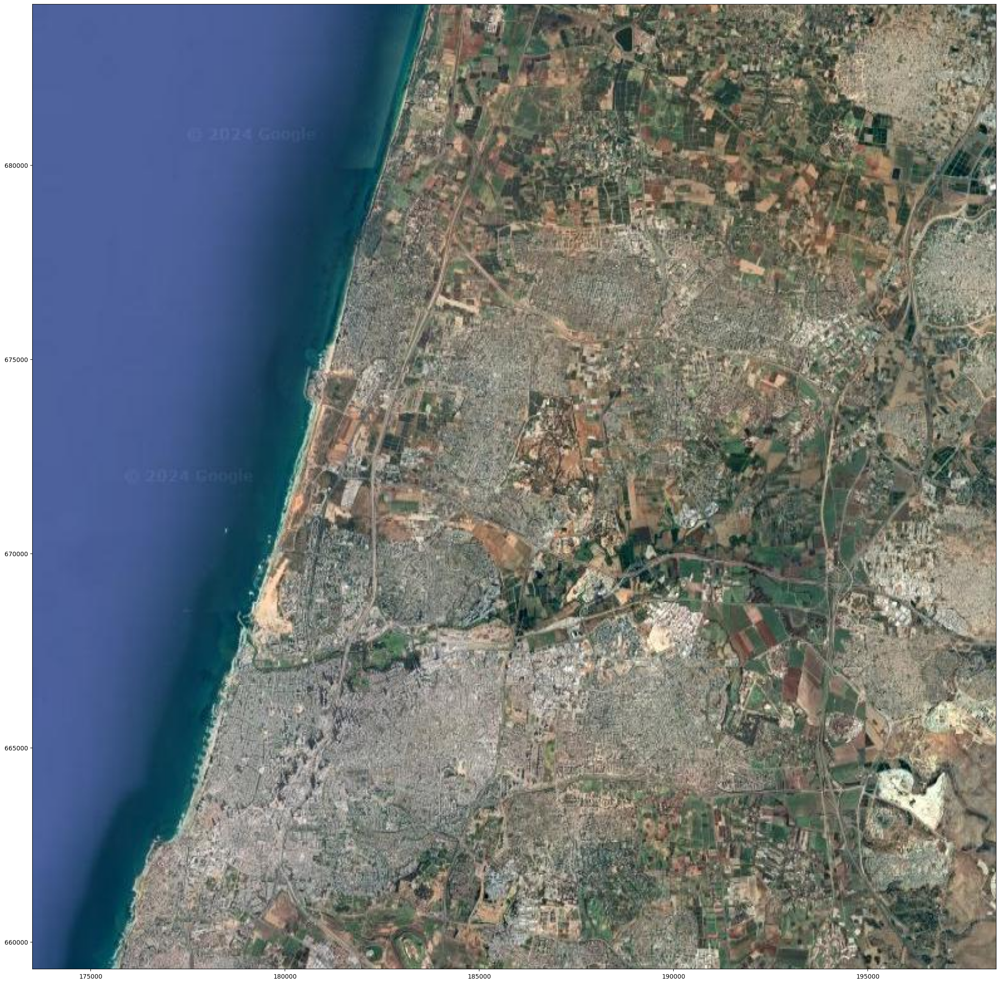

In [4]:
TA = dict(minx=175000,maxx=195000,maxy=680000,miny=655000,zoomlevel=12,tileServer=tiles_tk.getDataSourceList()[0],inputCRS=ITM, outputCRS=ITM)
img = tiles_tk.getImageFromCorners(**TA)
fig,ax = plt.subplots(1,1,figsize=(28,28))
satile_img = tiles_tk.presentation.plot(img,inputCRS=ITM,outputCRS=ITM,ax=ax)
satile_img

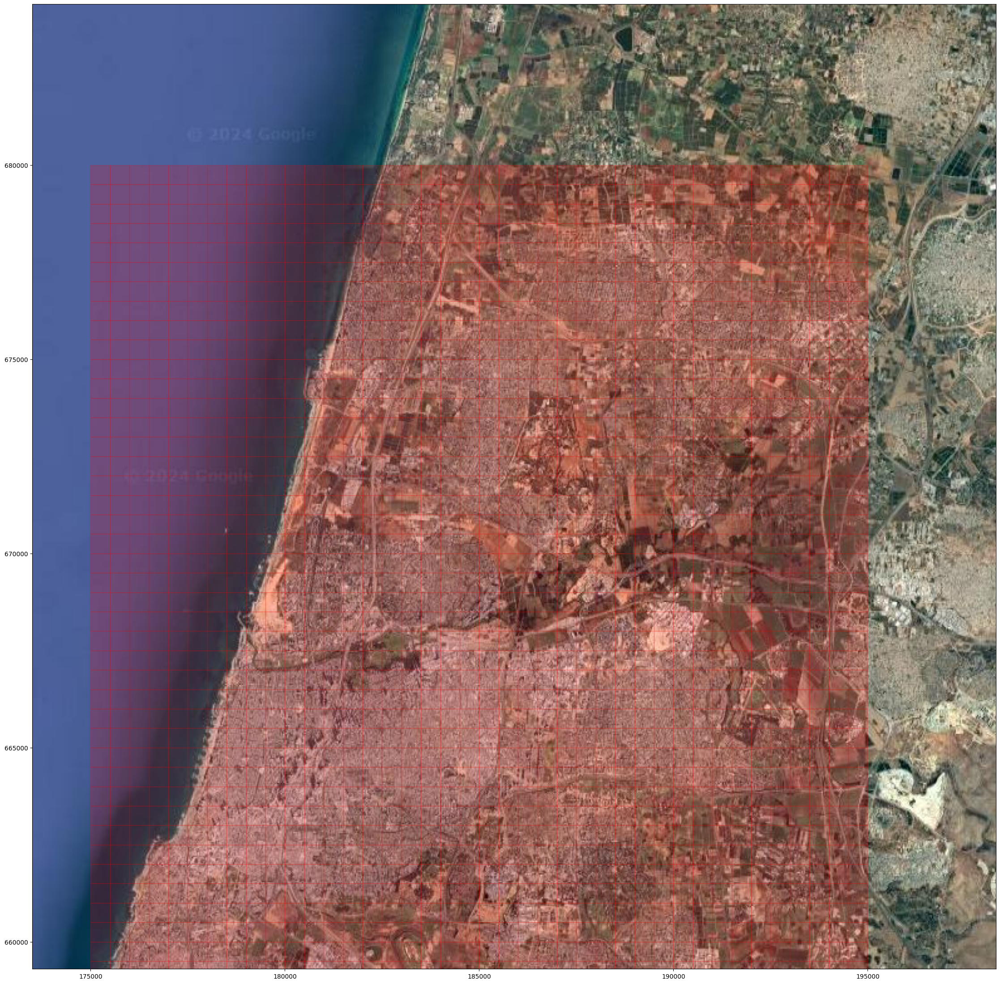

In [5]:
tk.presentation.plotLandcover(satile_img,xarray)